In [1]:
!pip install -q transformers accelerate peft diffusers>=0.25.0

In [5]:
from diffusers import DiffusionPipeline, LCMScheduler
from diffusers.utils import load_image, make_image_grid
import torch

In [2]:
cache_dir = "/home/ec2-user/SageMaker/.cache"

In [3]:
model_id = "stabilityai/stable-diffusion-xl-base-1.0"
lcm_lora_id = "latent-consistency/lcm-lora-sdxl"

pipe = DiffusionPipeline.from_pretrained(model_id, variant="fp16", cache_dir=cache_dir)
pipe.scheduler = LCMScheduler.from_config(pipe.scheduler.config)

pipe.load_lora_weights(lcm_lora_id, adapter_name="lora", cache_dir=cache_dir)
pipe.load_lora_weights("nerijs/pixel-art-xl", adapter_name="pixel", cache_dir=cache_dir)

pipe.set_adapters(["lora", "pixel"], adapter_weights=[1.0, 1.2])
pipe.to(device="cuda", dtype=torch.float16)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


pytorch_lora_weights.safetensors:   0%|          | 0.00/394M [00:00<?, ?B/s]

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.25.1",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "LCMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [4]:
prompt = "pixel, a cute corgi"
negative_prompt = "3d render, realistic"

num_images = 9

for i in range(num_images):
    img = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        num_inference_steps=4,
        guidance_scale=1.5,
    ).images[0]

    img.save(f"lcm_lora_{i}.png")

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

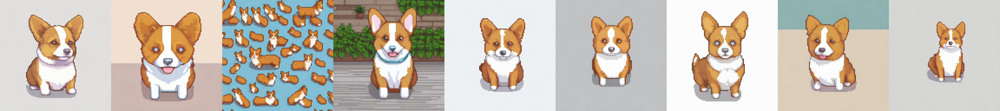

In [10]:
make_image_grid(
    list(map(load_image, [f"lcm_lora_{i}.png" for i in range(num_images)])),
    3,
    3,
)